# Deep Learning Interpretability: Visualizing ConvNet Activations, Filters, and Heatmaps

This notebook demonstrates several techniques for understanding the inner workings of Convolutional Neural Networks (ConvNets). We'll explore:

1.  **Visualizing Intermediate Activations:** Understanding what different layers in a ConvNet 'see' by inspecting their output activations.
2.  **Visualizing ConvNet Filters:** Generating synthetic input patterns that maximally activate specific filters in a given layer, revealing their learned features.
3.  **Visualizing Heatmaps for Class Activation (Grad-CAM):** Identifying the regions in an input image that are most important for a specific class prediction.

These methods provide valuable insights into how ConvNets make decisions, helping us to debug models, understand their biases, and build trust in their predictions.

## Part 1: Visualizing Intermediate Activations

In this section, we'll load a pre-trained convolutional neural network and inspect the feature maps (activations) generated by its intermediate layers when presented with an input image. This helps us understand how the network processes information at different depths.

In [ ]:
from tensorflow import keras

model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/convnet_from_scratch_with_augmentation.keras")

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 7, 7, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        12,545 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,982,084 (7.56 MB)

 Trainable params: 991,041 (3.78 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 991,043 (3.78 MB)

### Loading and Preprocessing Input Images

We'll load a couple of example images (a custom image and a cat image from a dataset) and preprocess them to match the input requirements of our model (e.g., target size, batch dimension).

In [ ]:
import numpy as np

img_path1 = "/content/IMG_1967.jpg"
img_path2 = keras.utils.get_file(
    fname="cat.jpg",
    origin="https://img-datasets.s3.amazonaws.com/cat.jpg")


def get_img_array(img_path, target_size):
  img = keras.utils.load_img(img_path, target_size=target_size)
  array = keras.utils.img_to_array(img)
  array = np.expand_dims(array, axis=0)
  return array

img_tensor1 = get_img_array(img_path1, target_size=(180, 180))
img_tensor2 = get_img_array(img_path2, target_size=(180, 180))

print(img_tensor1.shape)
print(img_tensor2.shape)

(1, 180, 180, 3)
(1, 180, 180, 3)


### Displaying Input Images

Let's visualize the preprocessed input images to ensure they are loaded correctly.

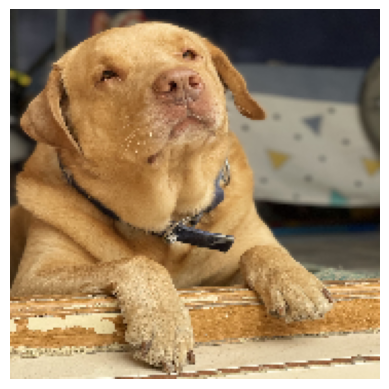

In [ ]:
import matplotlib.pyplot as plt

plt.axis("off")
plt.imshow(img_tensor1[0].astype("uint8"))
plt.show()

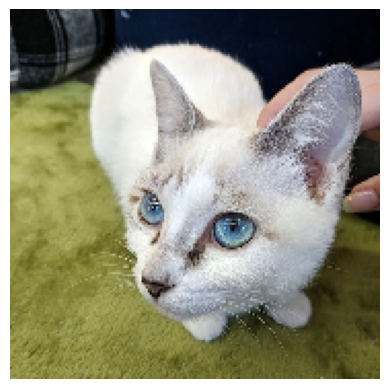

In [ ]:
plt.axis("off")
plt.imshow(img_tensor2[0].astype("uint8"))
plt.show()

### Creating an Activation Model

To visualize intermediate activations, we need a Keras model that outputs the feature maps of specific layers. We'll create a new model whose inputs are the original model's inputs and whose outputs are the outputs of the desired convolutional and pooling layers.

In [ ]:
#instantiating the model that returns layer activations
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
  if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
    layer_outputs.append(layer.output)
    layer_names.append(layer.name)

activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

### Generating Activations

Now, we'll use the `activation_model` to predict the activations for our input image. The output will be a list of NumPy arrays, one for each selected layer's activation.

In [ ]:
activations = activation_model.predict(img_tensor1)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
(1, 178, 178, 32)


### Visualizing a Single Channel

Each feature map (activation) has multiple channels. Let's visualize a single channel from the first convolutional layer to see what specific pattern it responds to.

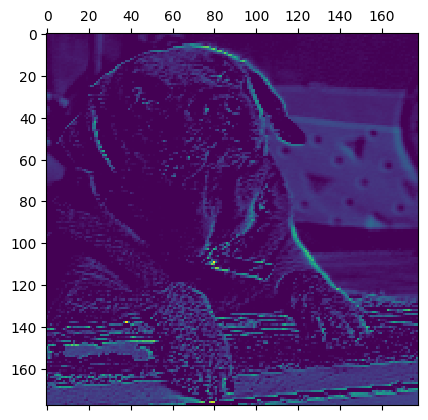

In [ ]:
#visualizing the 4th channel
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 4], cmap="viridis")
plt.show()


### visualizing every channel in every intermediate activation

### Visualizing All Channels in Every Intermediate Activation

To get a comprehensive view, we'll iterate through all selected layers and visualize every channel within their activation maps. We'll arrange these channels in a grid for easy comparison. The images are normalized for better visibility.

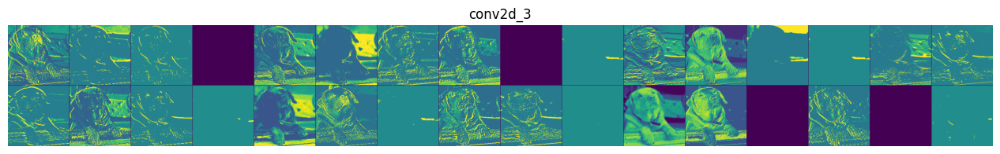

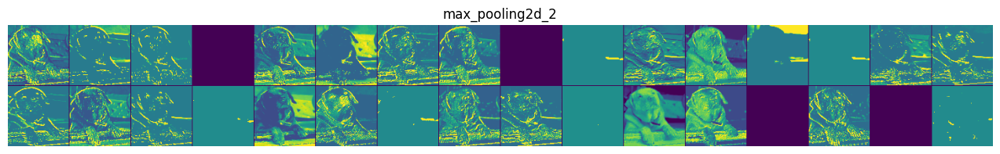

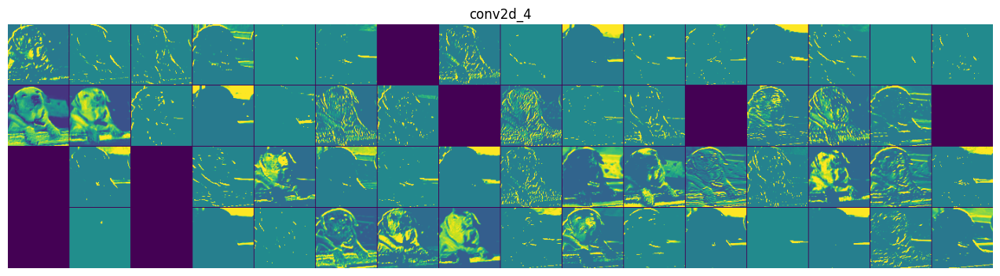

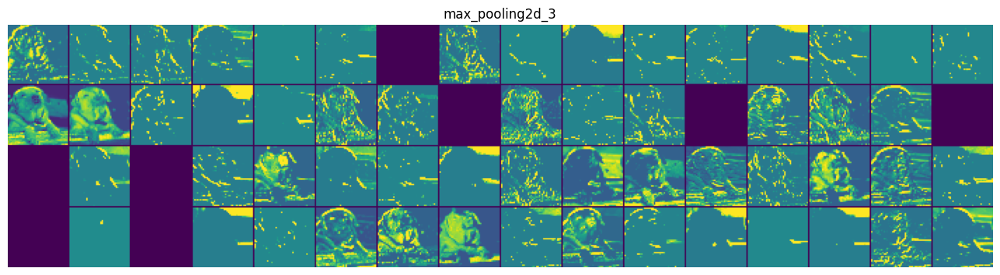

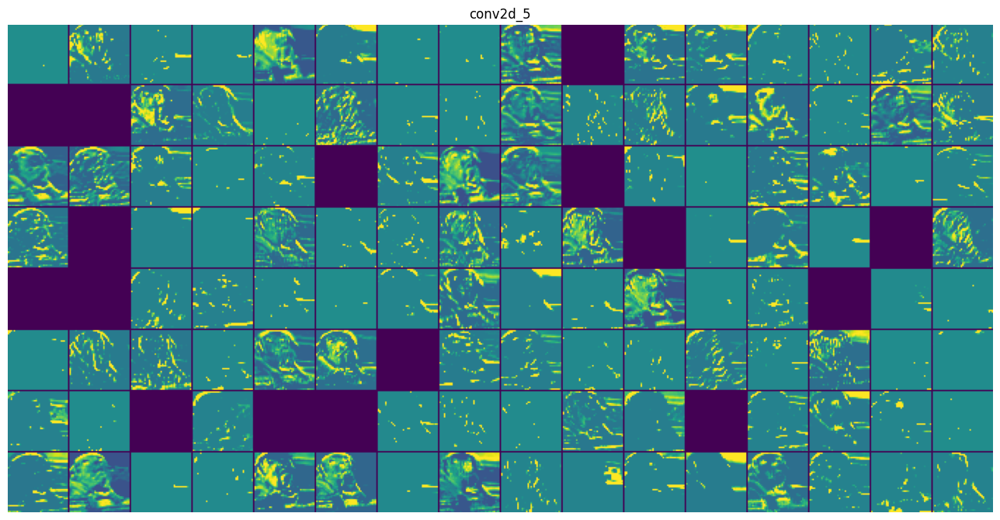

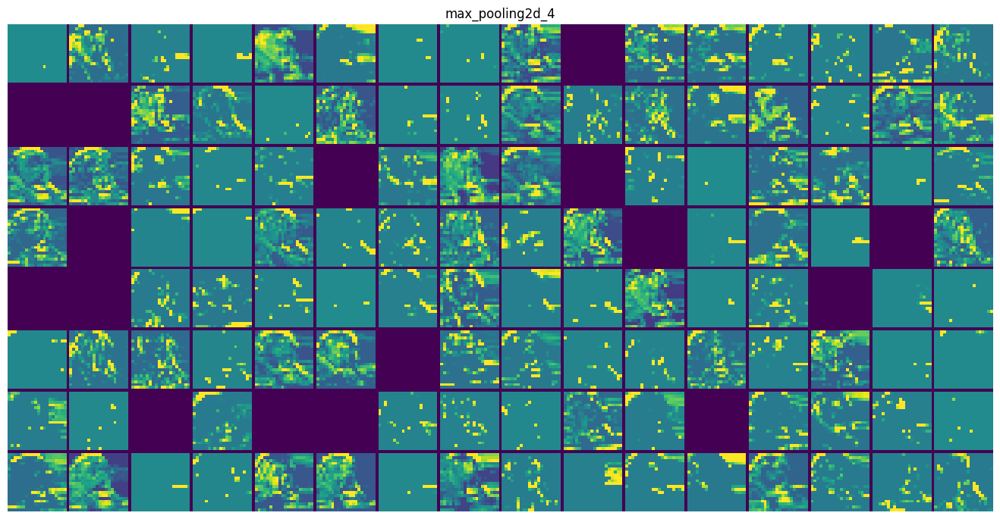

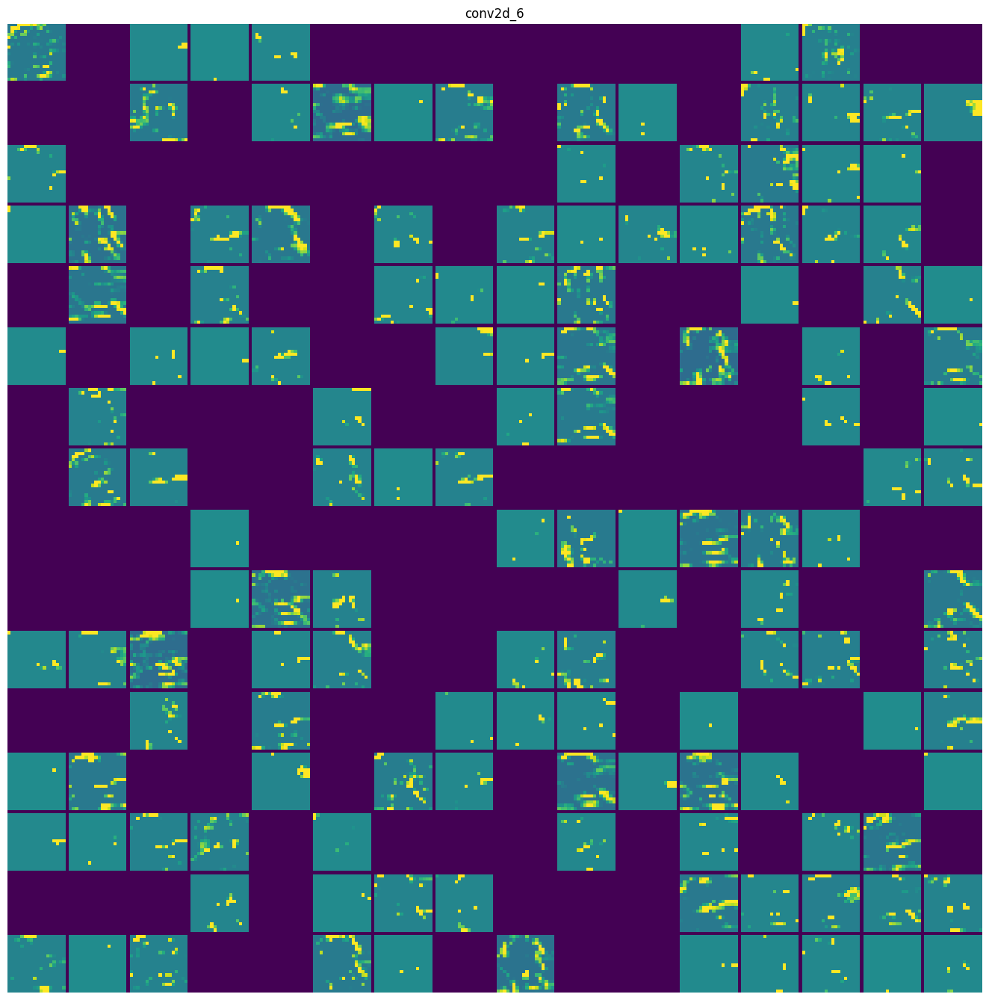

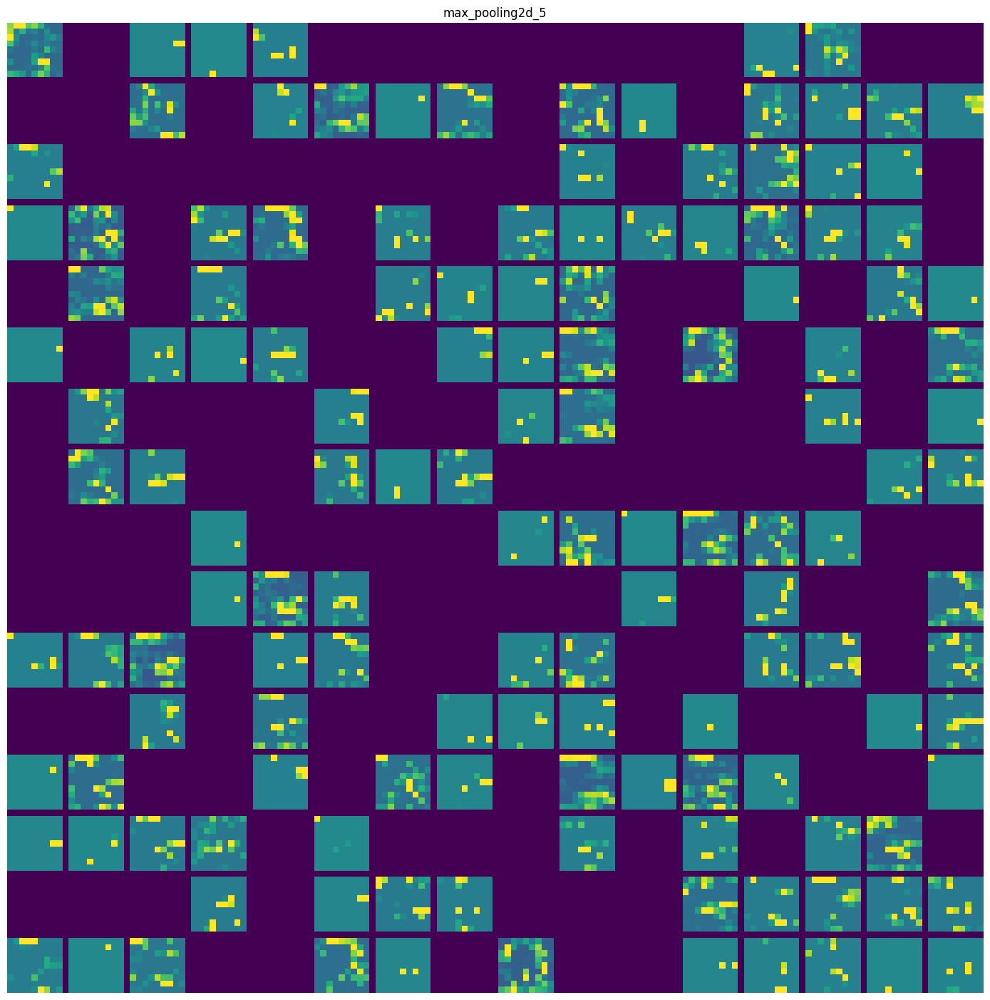

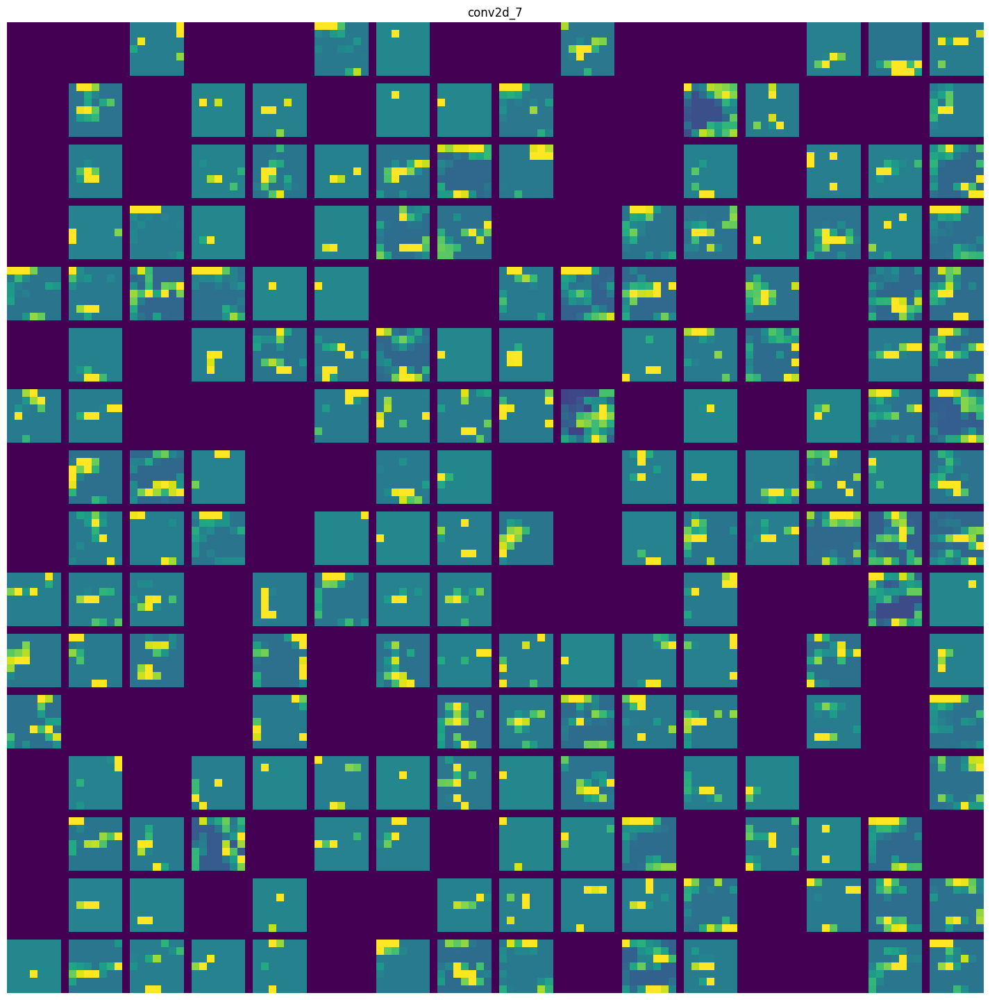

In [ ]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(
        ((size + 1) * n_cols - 1, images_per_row * (size + 1) - 1)
    )
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1) : (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row,
            ] = channel_image
    scale = 1.0 / size
    plt.figure(
        figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0])
    )
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

#### Key takeaways
1. Features extracted by a layer become increasingly abstract with the depth of layer
2. The activations of higher layers carry less and less information about the specific input and more and more information about the target.

## Part 2: Visualizing ConvNet Filters

In this section, we aim to understand what patterns or features individual filters within a ConvNet are looking for. We'll achieve this by generating synthetic images that maximally activate a given filter, using a technique called **Gradient Ascent**.

### Visualizing ConvNet Filters

### Loading the Xception Model Convolutional Base

We'll use a pre-trained Xception model (without the top classification layer) as our base. We'll also print the names of its convolutional layers to identify which filters we can visualize.

In [ ]:
#instantiating Xception convolution base

model = keras.applications.xception.Xception(weights="imagenet", include_top=False)

for layer in model.layers:
  if isinstance(layer, (layers.Conv2D, layers.SeparableConv2D)):
    print(layer.name)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d
block3_sepconv1
block3_sepconv2
conv2d_1
block4_sepconv1
block4_sepconv2
conv2d_2
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_3
block14_sepconv1
block14_sepconv2


### Creating a Feature Extractor Model

We'll create a new Keras model that takes an input image and outputs the activation of a specific convolutional layer (e.g., 'block3_sepconv1'). This `feature_extractor` will allow us to isolate the output of a chosen layer.

In [ ]:
#creating a feature extractor model
layer_name = "block3_sepconv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

#using this feature extractor
activation = feature_extractor(
    keras.applications.xception.preprocess_input(img_tensor1)
)

### Gradient Ascent for Filter Visualization

This is the core of filter visualization. We define:

1.  **`compute_loss`**: A function that quantifies how much a given input image activates a specific filter in the target layer (we want to maximize this activation).
2.  **`gradient_ascent_step`**: A function that iteratively modifies an input image using gradient ascent to maximize the `compute_loss`. It computes the gradient of the loss with respect to the input image and updates the image in the direction that increases the loss.
3.  **`generate_filter_pattern`**: A function that initializes a random image and applies `gradient_ascent_step` multiple times to generate the synthetic image pattern that maximally activates a given filter.
4.  **`deprocess_image`**: A utility function to post-process the generated image (normalize, clip, and convert to `uint8`) so it can be properly displayed.

In [ ]:
import tensorflow as tf

#defining a function that returns a scalar quantifying how much a given input image activates a given filter in the layer

def compute_loss(image, filter_index):
  activation = feature_extractor(image)
  filter_activation = activation[:, 2:-2, 2:-2, filter_index]
  return tf.reduce_mean(filter_activation)

##loss maximization with Stochastic Gradient Descent
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
  with tf.GradientTape() as tape:
    tape.watch(image)
    loss = compute_loss(image, filter_index)
  grads = tape.gradient(loss, image)
  grads = tf.math.l2_normalize(grads)
  image += learning_rate * grads
  return image


#function to generate filter visualizations
img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
  iterations = 30
  learning_rate = 100
  image = tf.random.uniform(
      minval=0,
      maxval=255,
      shape=(1, img_width, img_height, 3))
  for i in range(iterations):
    image = gradient_ascent_step(image, filter_index, learning_rate)
  return image[0].numpy()

#utility function to convert a tensor into a valid image
def deprocess_image(image):
  image -= image.mean()
  image /= image.std()
  image *= 64
  image += 128
  image = np.clip(image, 0, 255).astype("uint8")
  image = image[25:-25, 25:-25, :]
  return image



### Visualizing a Single Filter Pattern

Let's generate and display the pattern that maximally activates the 2nd channel (`filter_index=2`) in the 'block3_sepconv1' layer. This image shows what visual feature this particular filter is 'tuned' to detect.

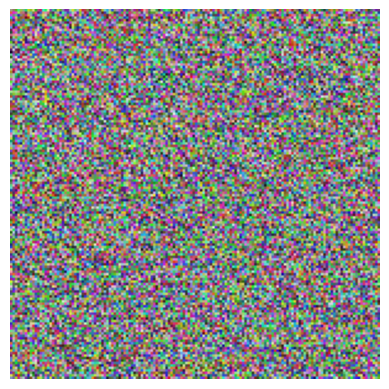

In [ ]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))##pattern that 2nd channel in layer block3_sepconv1 responds to maximally
#plt.show()

### Generating and Stitching All Filter Patterns

To get a broader understanding, we'll generate patterns for all 64 filters in the 'block3_sepconv1' layer and stitch them together into a single composite image. This allows for a comprehensive overview of the features learned by this layer.

In [ ]:
all_images = []
for filter_index in range(64):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(generate_filter_pattern(filter_index))
    all_images.append(image)

margin = 5
n = 8
box_width = img_width - 25 * 2
box_height = img_height - 25 * 2
full_width = n * box_width + (n - 1) * margin
full_height = n * box_height + (n - 1) * margin
stitched_filters = np.zeros((full_width, full_height, 3))

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            (box_width + margin) * i : (box_width + margin) * i + box_width,
            (box_height + margin) * j : (box_height + margin) * j + box_height,
            :,
        ] = image

keras.utils.save_img(f"/content/drive/MyDrive/Colab Notebooks/ConvNetVisuals/filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

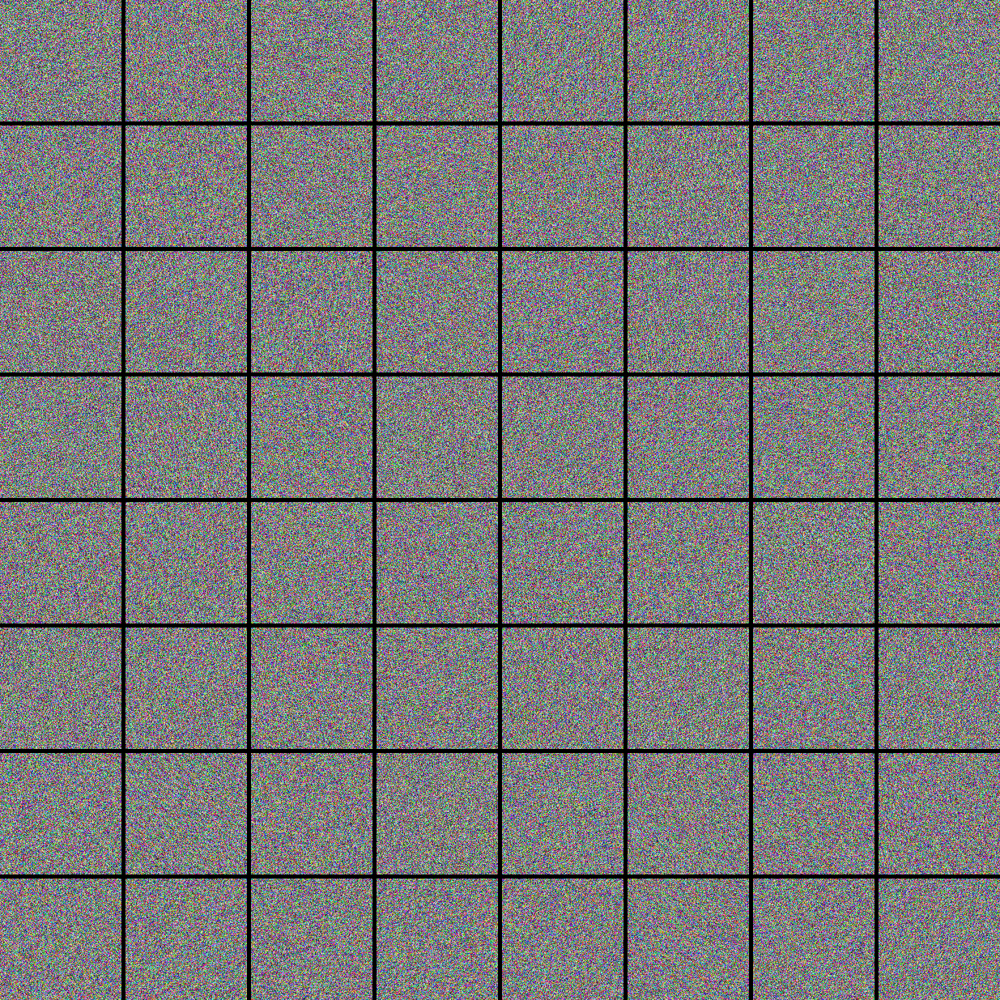

## Part 3: Visualizing Heatmaps for Class Activation (Grad-CAM)

Grad-CAM (Gradient-weighted Class Activation Mapping) is a technique to produce visual explanations for decisions made by ConvNets. It highlights the regions in the input image that are most important for the network's prediction for a specific class.

### Visualizing Heatmaps for class activation

### Loading the Xception Network and Images

We'll load the full Xception model (including the top classification layer, pre-trained on ImageNet) and prepare a new image (an elephant) along with our previous dog image for this visualization. The `get_img_array2` function now includes Xception's specific preprocessing.

In [ ]:
#loading the Xception network with pretrained weights

model = keras.applications.xception.Xception(weights="imagenet")

img_path = keras.utils.get_file(
    fname = "elephant.jpg",
    origin ="https://img-datasets.s3.amazonaws.com/elephant.jpg")

def get_img_array2(img_path, target_size):
  img = keras.utils.load_img(img_path, target_size=target_size)
  array = keras.utils.img_to_array(img)
  array = np.expand_dims(array, axis=0)
  array = keras.applications.xception.preprocess_input(array)
  return array

img_array1 = get_img_array2(img_path1, target_size=(299, 299))
img_array2 = get_img_array2(img_path, target_size=(299, 299))

### Making Predictions

Before generating heatmaps, let's confirm the model's predictions for our example images using `decode_predictions` to see the top predicted classes and their probabilities.

In [ ]:
preds = model.predict(img_array2)
print(keras.applications.xception.decode_predictions(preds, top=3)[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
[('n02504458', 'African_elephant', np.float32(0.8699399)), ('n01871265', 'tusker', np.float32(0.0769561)), ('n02504013', 'Indian_elephant', np.float32(0.023541728))]


In [ ]:
preds = model.predict(img_array1)
print(keras.applications.xception.decode_predictions(preds, top=4)[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step
[('n02100583', 'vizsla', np.float32(0.5923441)), ('n02099712', 'Labrador_retriever', np.float32(0.08252748)), ('n02099849', 'Chesapeake_Bay_retriever', np.float32(0.07287572)), ('n02108422', 'bull_mastiff', np.float32(0.039021313))]


### Displaying Images with Top Predictions

To better contextualize the heatmaps, we'll display the input images along with their top predicted classes and confidence scores. The `deprocess_image_for_display` function reverses the Xception preprocessing so the image can be shown correctly.

In [ ]:
img_array1.shape

(1, 299, 299, 3)

### Setting Up Grad-CAM Model Components

For Grad-CAM, we need two sub-models:
1.  `last_conv_layer_model`: Outputs the feature maps of the last convolutional layer (e.g., 'block14_sepconv2_act'). This is where the spatial information is still rich.
2.  `classifier_model`: Takes the output of the last convolutional layer and applies the remaining classification layers of the original model (pooling and dense layers) to predict class scores.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


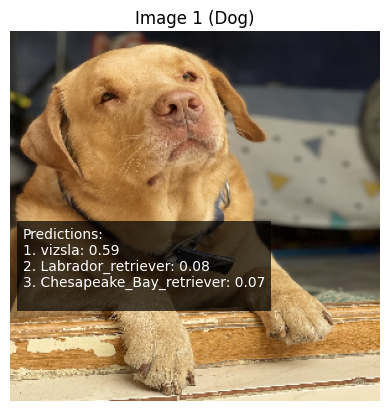

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow import keras # Ensure keras is imported for decode_predictions

def deprocess_image_for_display(image_array):
  # Reverse Xception's preprocessing for display
  # Xception preprocess_input scales inputs to the range [-1, 1]
  # So we scale it back to [0, 255]
  image_array = image_array / 2. + 0.5
  image_array = image_array * 255.
  image_array = np.clip(image_array, 0, 255).astype("uint8")
  return image_array

plt.axis("off")
# Remove the batch dimension and deprocess the image for proper display
displayed_image = deprocess_image_for_display(img_array1[0])
plt.imshow(displayed_image)
plt.title("Image 1 (Dog)")

# Get predictions for img_array1 using the Xception model
# Assuming 'model' variable (Xception) is available from previous cells
preds_dog = model.predict(img_array1)
decoded_preds_dog = keras.applications.xception.decode_predictions(preds_dog, top=3)[0]

# Format predictions into a readable string
predictions_text = "Predictions:\n"
for i, (imagenet_id, label, score) in enumerate(decoded_preds_dog):
    predictions_text += f"{i+1}. {label}: {score:.2f}\n"

# Add the predictions text to the image
# Positioning the text relative to the image size
# (x, y) coordinates. Adjust x for horizontal position, y for vertical.
# A small margin from the bottom-left is usually good.
plt.text(10, displayed_image.shape[0] - 80, # Adjust y-coordinate as needed for visibility
         predictions_text,
         color='white', # Text color
         fontsize=10,
         bbox=dict(facecolor='black', alpha=0.7, edgecolor='none')) # Background box for readability

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


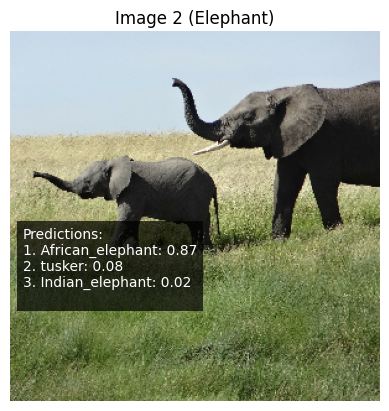

In [ ]:
plt.axis("off")
# Remove the batch dimension and deprocess the image for proper display
displayed_image_elephant = deprocess_image_for_display(img_array2[0])
plt.imshow(displayed_image_elephant)
plt.title("Image 2 (Elephant)")

# Get predictions for img_array2 using the Xception model
# Assuming 'model' variable (Xception) is available from previous cells
preds_elephant = model.predict(img_array2)
decoded_preds_elephant = keras.applications.xception.decode_predictions(preds_elephant, top=3)[0]

# Format predictions into a readable string
predictions_text_elephant = "Predictions:\n"
for i, (imagenet_id, label, score) in enumerate(decoded_preds_elephant):
    predictions_text_elephant += f"{i+1}. {label}: {score:.2f}\n"

# Add the predictions text to the image
plt.text(10, displayed_image_elephant.shape[0] - 80, # Adjust y-coordinate as needed for visibility
         predictions_text_elephant,
         color='white', # Text color
         fontsize=10,
         bbox=dict(facecolor='black', alpha=0.7, edgecolor='none')) # Background box for readability

plt.show()

In [ ]:
np.argmax(preds_dog[0])

np.int64(211)

In [ ]:
np.argmax(preds_elephant[0])

np.int64(386)

In [ ]:
#setting up a model that returns a last convolution layer
last_conv_layer_name = "block14_sepconv2_act"
classifier_layer_names = ["avg_pool",
                          "predictions",]
last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

#reapplying the classifier on top of the last convolution layer
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in classifier_layer_names:
  x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

### Retrieving Gradients of the Top Predicted Class

We calculate the gradients of the top predicted class's score with respect to the output of the `last_conv_layer`. These gradients indicate how much each feature map activation contributes to the prediction of that specific class.

In [ ]:
#retrieving the gradients of the top predicted class(w.r.to activations of the last convolution layer)
with tf.GradientTape() as tape:
  last_conv_layer_output = last_conv_layer_model(img_array2)
  tape.watch(last_conv_layer_output)
  preds = classifier_model(last_conv_layer_output)
  top_pred_index = tf.argmax(preds[0])
  top_class_channel = preds[:, top_pred_index]

grads = tape.gradient(top_class_channel, last_conv_layer_output)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_302']
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


### Gradient Pooling and Channel Importance Weighting

1.  **Pooled Gradients**: We compute the average of the gradients across spatial dimensions (height and width) for each channel. This gives us a 'weight' for each feature map channel, indicating its importance for the target class.
2.  **Channel Importance Weighting**: We multiply each channel of the `last_conv_layer_output` by its corresponding pooled gradient weight. This amplifies important features and suppresses less relevant ones.
3.  **Heatmap Generation**: We then take the mean across the channels to produce a single 2D heatmap, showing the areas of the image that are most influential for the prediction.

In [ ]:
#gradient pooling and channel importance weighting

pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
  last_conv_layer_output[:, :, i] *= pooled_grads[i]
heatmap = np.mean(last_conv_layer_output, axis=-1)

### Post-processing and Displaying the Raw Heatmap

Before displaying, we apply a ReLU operation (`np.maximum(heatmap, 0)`) to the heatmap, keeping only positive contributions (features that positively influence the class prediction). We then normalize it to a range of 0-1 and display it as a grayscale image.

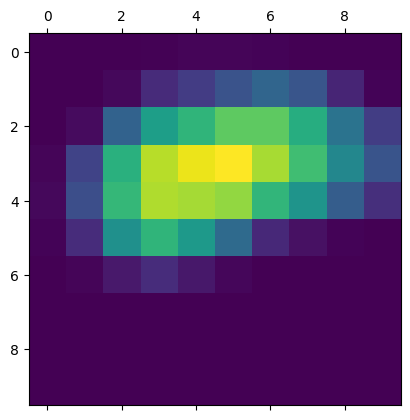

In [ ]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

### Superimposing Heatmap on Original Image

To make the Grad-CAM visualization more intuitive, we superimpose the generated heatmap onto the original input image. We use a colormap (e.g., 'jet') to colorize the heatmap and blend it with the original image. This clearly highlights the areas of the image that the model focused on when making its prediction.

/tmp/ipykernel_11648/1358311572.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


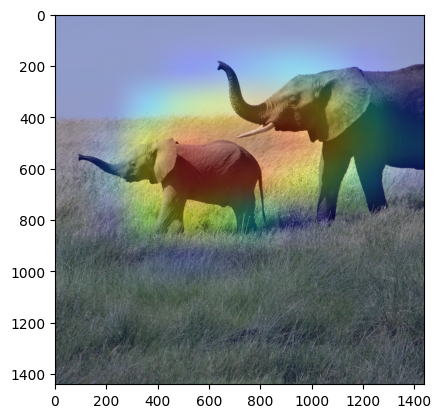

In [ ]:
import matplotlib.cm as cm

img = keras.utils.load_img(img_path)
img = keras.utils.img_to_array(img)

heatmap = np.uint8(255 * heatmap)

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

jet_heatmap = keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)

superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.utils.array_to_img(superimposed_img)

plt.imshow(superimposed_img)

##### This visualization technique answered 2 questions:
1. where did the network think this image contained elephants?
2. where is the african elephant located in this picture?

## Conclusion

This notebook has demonstrated three powerful techniques for interpreting Convolutional Neural Networks:

*   **Intermediate Activation Visualization:** Provides a look into the hierarchical feature extraction process.
*   **Filter Visualization (Gradient Ascent):** Helps understand the specific visual patterns individual filters are designed to detect.
*   **Class Activation Heatmaps (Grad-CAM):** Pinpoints the discriminative regions in an input image that influence a specific class prediction.

These methods are crucial for debugging, improving, and building trust in deep learning models by making their 'black box' nature more transparent.